# Import

In [1]:
import GODE

2023-11-30 13:14:35.262441: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
import numpy as np
import pandas as pd

In [3]:
from pygsp import graphs, filters, plotting, utils

# Linear

## Data_Linear

In [4]:
np.random.seed(6)
epsilon = np.around(np.random.normal(size=1000),15)
signal = np.random.choice(np.concatenate((np.random.uniform(-7, -5, 25).round(15), np.random.uniform(5, 7, 25).round(15), np.repeat(0, 950))), 1000)
eta = signal + epsilon

outlier_true_linear= signal.copy()
outlier_true_linear = list(map(lambda x: 1 if x!=0 else 0,outlier_true_linear))
index_of_trueoutlier_bool = signal!=0

In [5]:
x_1 = np.linspace(0,2,1000)
y1_1 = 5 * x_1
y_1 = y1_1 + eta # eta = signal + epsilon
_df=pd.DataFrame({'x':x_1, 'y':y_1})

## GODE_Lienar

In [6]:
Lin = GODE.Linear(_df)

In [7]:
Lin.fit(sd=20)

In [8]:
outlier_old_linear, outlier_linear, outlier_index_linear = GODE.GODE_Anomalous(Lin(_df),contamination=0.05)

## Plot_Linear

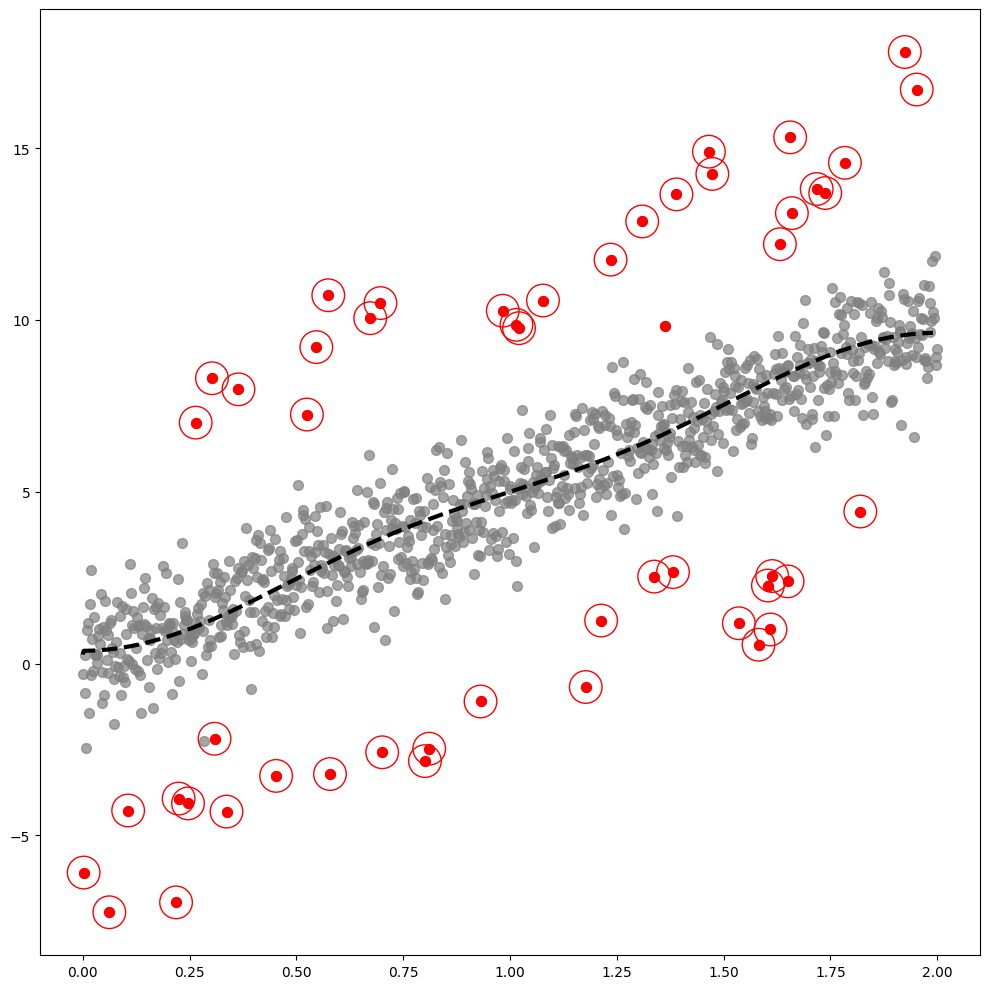

In [9]:
GODE.Linear_plot(Lin(_df),index_of_trueoutlier_bool, outlier_index_linear)

In [10]:
Lin(_df)['x'][:10]

array([0.        , 0.002002  , 0.004004  , 0.00600601, 0.00800801,
       0.01001001, 0.01201201, 0.01401401, 0.01601602, 0.01801802])

In [11]:
Lin(_df)['y'][:10]

array([-0.31178367, -6.08358567,  0.23784081, -0.86906177, -2.44674061,
        0.96330157,  1.18712379, -1.44402316,  1.71937116, -0.33980351])

In [12]:
Lin(_df)['yhat'][:10]

array([0.26224717, 0.37091714, 0.37104804, 0.3712662 , 0.3715716 ,
       0.37196424, 0.37244408, 0.37301111, 0.3736653 , 0.37440661])

## Confusion matrix_Linear

In [13]:
Conf_linear = GODE.Conf_matrx(outlier_true_linear,outlier_linear)

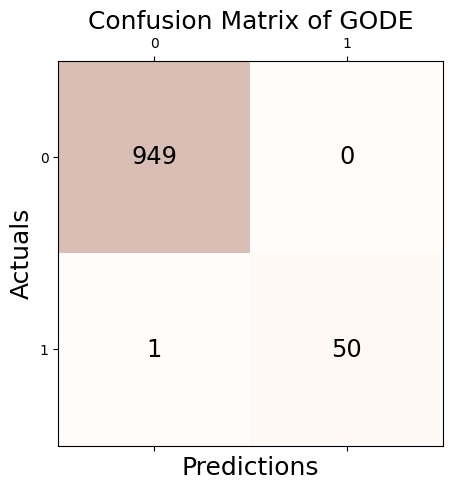

Accuracy: 0.999
Precision: 1.000
Recall: 0.980
F1 Score: 0.990


In [14]:
Conf_linear.conf('GODE')

In [15]:
Conf_linear()

{'Accuracy': 0.999,
 'Precision': 1.0,
 'Recall': 0.9803921568627451,
 'F1 Score': 0.99009900990099}

---

# Orbit

## Data_Orbit

In [16]:
np.random.seed(777)
epsilon = np.around(np.random.normal(size=1000),15)
signal = np.random.choice(np.concatenate((np.random.uniform(-4, -1, 25).round(15), np.random.uniform(1, 4, 25).round(15), np.repeat(0, 950))), 1000)
eta = signal + epsilon
pi=np.pi
n=1000
ang=np.linspace(-pi,pi-2*pi/n,n)
r=5+np.cos(np.linspace(0,12*pi,n))
vx=r*np.cos(ang)
vy=r*np.sin(ang)
f1=10*np.sin(np.linspace(0,6*pi,n))
f = f1 + eta
_df = pd.DataFrame({'x' : vx, 'y' : vy, 'f1':f1, 'f' : f})
outlier_true_orbit = signal.copy()
outlier_true_orbit = list(map(lambda x: 1 if x!=0 else 0,outlier_true_orbit))
index_of_trueoutlier_bool = signal!=0

## GODE_Orbit

In [17]:
Or = GODE.Orbit(_df)

In [18]:
Or.fit(sd=15,method = 'Euclidean')

100%|██████████| 1000/1000 [00:01<00:00, 613.53it/s]


In [19]:
outlier_old_orbit, outlier_orbit, outlier_index_orbit = GODE.GODE_Anomalous(Or(_df),contamination=0.05)

## Plot_Orbit

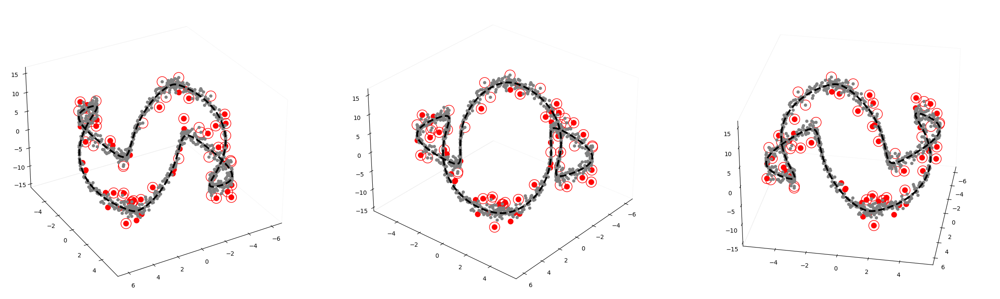

In [20]:
GODE.Orbit_plot(Or(_df),index_of_trueoutlier_bool,outlier_index_orbit)

In [21]:
Or(_df)['x'][:5]

array([-6.        , -5.99916963, -5.9966797 , -5.99253378, -5.98673778])

In [22]:
Or(_df)['y'][:5]

array([-7.34788079e-16, -3.76943905e-02, -7.53604665e-02, -1.12969981e-01,
       -1.50494820e-01])

In [23]:
Or(_df)['f1'][:5]

array([0.        , 0.18867305, 0.37727893, 0.56575049, 0.75402065])

In [24]:
Or(_df)['f'][:5]

array([-0.46820879, -0.63415181,  0.31189882, -0.14761143,  1.66037153])

In [25]:
Or(_df)['fhat'][:5]

array([0.08086037, 0.2425556 , 0.40437747, 0.5665164 , 0.72915801])

## Confusion matrix_Orbit

In [26]:
Conf_orbit = GODE.Conf_matrx(outlier_true_orbit,outlier_orbit)

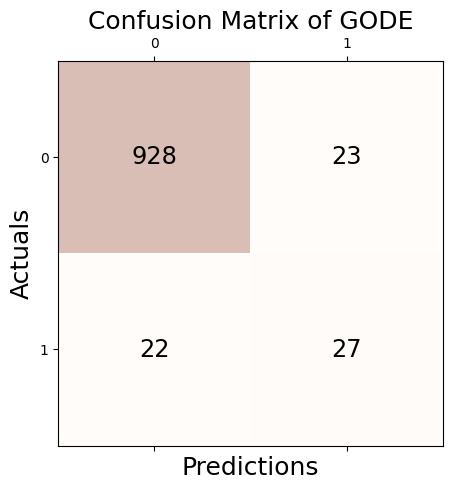

Accuracy: 0.955
Precision: 0.540
Recall: 0.551
F1 Score: 0.545


In [27]:
Conf_orbit.conf('GODE')

In [28]:
Conf_orbit()

{'Accuracy': 0.955,
 'Precision': 0.54,
 'Recall': 0.5510204081632653,
 'F1 Score': 0.5454545454545455}

---

# Bunny

## Data_Bunny

In [29]:
G = graphs.Bunny()
n = G.N
g = filters.Heat(G, tau=75) 
n=2503
np.random.seed(1212)
normal = np.around(np.random.normal(size=n),15)
unif = np.concatenate([np.random.uniform(low=3,high=7,size=60), np.random.uniform(low=-7,high=-3,size=60),np.zeros(n-120)]); np.random.shuffle(unif)
noise = normal + unif
f = np.zeros(n)
f[1000] = -3234
f = g.filter(f, method='chebyshev') 
outlier_true_bunny = unif.copy()
outlier_true_bunny = list(map(lambda x: 1 if x !=0  else 0,outlier_true_bunny))
index_of_trueoutlier_bool_bunny = unif!=0

2023-11-30 13:14:41,369:[WARNING](pygsp.graphs.graph.lmax): The largest eigenvalue G.lmax is not available, we need to estimate it. Explicitly call G.estimate_lmax() or G.compute_fourier_basis() once beforehand to suppress the warning.


In [30]:
G.coords.shape
_W = G.W.toarray()
_x = G.coords[:,0]
_y = G.coords[:,1]
_z = -G.coords[:,2]
_df = pd.DataFrame({'x':_x,'y':_y,'z':_z, 'f1' : f, 'f':f+noise,'noise': noise})

## GODE_Bunny

In [31]:
bu = GODE.BUNNY(_df,_W)

In [32]:
bu.fit(sd=20)

In [33]:
outlier_old_bunny, outlier_bunny, outlier_index_bunny = GODE.GODE_Anomalous(bu(_df),contamination=0.05)

## Plot_Bunny

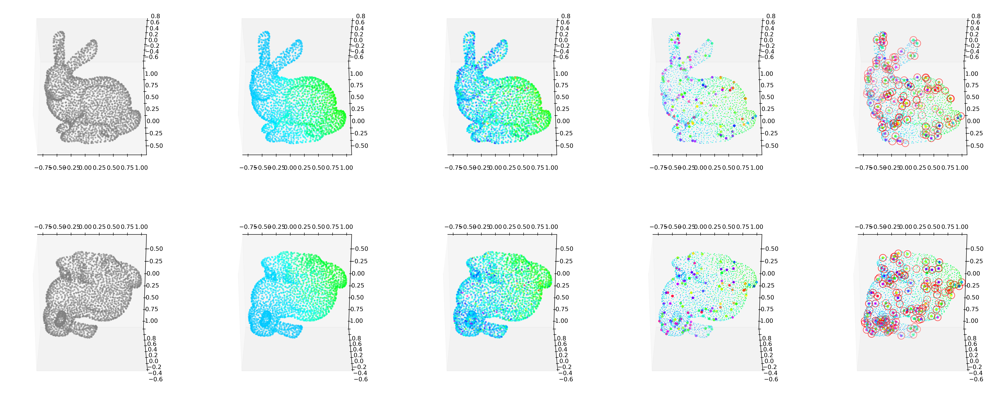

In [34]:
GODE.Bunny_plot(bu(_df),index_of_trueoutlier_bool_bunny,outlier_index_bunny)

In [35]:
bu(_df)

{'x': array([ 0.26815193, -0.58456893, -0.02730755, ...,  0.15397547,
        -0.45056488, -0.29405249]),
 'y': array([ 0.39314334,  0.63468595,  0.33280949, ...,  0.80205526,
         0.6207154 , -0.40187451]),
 'z': array([-0.13834514, -0.22438843,  0.08658215, ...,  0.33698514,
         0.58353051, -0.08647485]),
 'f1': array([-1.54422488, -0.03596483, -0.93972715, ..., -0.01924028,
        -0.02470869, -0.26266752]),
 'f': array([-0.8068728 , -0.65326195, -4.41287087, ..., -2.06257107,
         0.72882576, -0.47420275]),
 'fhat': array([-1.82796431,  0.04748775, -1.12152947, ..., -0.03652692,
         0.06627654,  0.1743586 ])}

## Confusion matrix_Bunny

In [36]:
Conf_bunny = GODE.Conf_matrx(outlier_true_bunny,outlier_bunny)

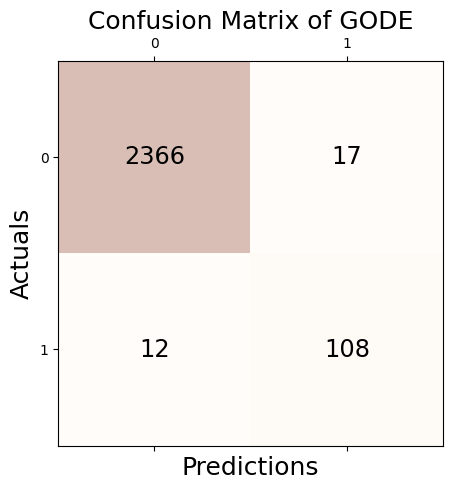

Accuracy: 0.988
Precision: 0.864
Recall: 0.900
F1 Score: 0.882


In [37]:
Conf_bunny.conf('GODE')

In [38]:
Conf_bunny()

{'Accuracy': 0.9884139033160207,
 'Precision': 0.864,
 'Recall': 0.9,
 'F1 Score': 0.8816326530612244}

---

# Earthquake

## Data_Earthquake

In [39]:
_df = pd.concat([pd.read_csv('00_05.csv'),pd.read_csv('05_10.csv'),pd.read_csv('10_15.csv'),pd.read_csv('15_20.csv')]).iloc[:,[0,1,2,4]]

In [40]:
_df = _df.assign(Year=list(map(lambda x: x.split('-')[0], _df.time))).rename(columns={'latitude' : 'x', 'longitude' : 'y', 'mag': 'f'}).iloc[:,1:]
_df.Year = _df.Year.astype(np.float64)

## GODE_Earthquake

In [41]:
Er = GODE.Earthquake(_df.query("2010 <= Year < 2011"))

In [42]:
Er.fit(sd=20, method = 'Haversine')

100%|██████████| 4790/4790 [00:39<00:00, 121.06it/s]


In [43]:
Er(_df.query("2010 <= Year < 2011"))

{'x': array([  0.663, -19.209, -31.83 , ...,  40.726,  30.646,  26.29 ]),
 'y': array([ -26.045,  167.902, -178.135, ...,   51.925,   83.791,   99.866]),
 'f': array([5.5, 5.1, 5. , ..., 5. , 5.2, 5. ]),
 'fhat': array([5.62793904, 5.15719404, 4.99555904, ..., 5.42038559, 5.27983909,
        5.08949907])}

In [44]:
outlier_old_earthquake, outlier_earthquake, outlier_index_earthquake = GODE.GODE_Anomalous(Er(_df.query("2010 <= Year < 2011")),contamination=0.05)

## Plot_Earthquake

In [45]:
GODE.Earthquake_plot(Er(_df.query("2010 <= Year < 2011")),outlier_index_earthquake,lat_center=37.7749, lon_center=-122.4194,fThresh=7,adjzoom=5,adjmarkersize = 40)